# Personal Information
Name: **Ties Leneman**

StudentID: **15843475**

Email: [**ties.leneman@student.uva.nl**](youremail@student.uva.nl)

Github: **https://github.com/Tiestonnie/Master-thesis-2025/**

Submitted on: **23.03.2025**

# Data Context
The dataset that is used is sourced from the European Centre for Medium-Range Weather Forecasts (ECMWF) ERA5 reanalysis dataset. The ERA5 reanlysis dataset provides globally hourly estimates for a large number of atmospheric, ocean-wave and land-surface quantities. Data is available from 1940 and onwards. The data that is downloaded from the website in NETCDF format consists of twelve variables and covers the entire year of 2012, with a 2-day temporal resolution (days 01, 03, ..., 31) at 06:00 UTC each day, resulting in 187 time steps. Spatially, the dataset encompasses the whole available region, with a resolution of 0.25° × 0.25°. This results in a total of 194150880 datapoints per variable.

# Data Description

In [ ]:
# Imports
import numpy as np
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import imageio
import os
import shutil
from IPython.display import Image


### Data Loading

In [13]:

nc = r"C:/Users/31610/Documents/UvA/Master thesis/Data/data_stream-oper_stepType-instant.nc"
nc1 = r"C:/Users/31610/Documents/UvA/Master thesis/Data/data_stream-oper_stepType-accum.nc"

# Opening the NETCDF files using xarray
ds = xr.open_dataset(nc)
ds_olr = xr.open_dataset(nc1)




In [16]:
# Checking the length and size of the datasets
for key in ds.keys():
    print(f"Variable: {key} | Shape: {ds[key].shape} | Size: {ds[key].size}")

for key in ds_olr.keys():
    print(f"Variable: {key} | Shape: {ds_olr[key].shape} | Size: {ds_olr[key].size}")



Variable: u10 | Shape: (187, 721, 1440) | Size: 194150880
Variable: v10 | Shape: (187, 721, 1440) | Size: 194150880
Variable: d2m | Shape: (187, 721, 1440) | Size: 194150880
Variable: t2m | Shape: (187, 721, 1440) | Size: 194150880
Variable: msl | Shape: (187, 721, 1440) | Size: 194150880
Variable: sst | Shape: (187, 721, 1440) | Size: 194150880
Variable: z | Shape: (187, 721, 1440) | Size: 194150880
Variable: tcwv | Shape: (187, 721, 1440) | Size: 194150880
Variable: v100 | Shape: (187, 721, 1440) | Size: 194150880
Variable: u100 | Shape: (187, 721, 1440) | Size: 194150880
Variable: tp | Shape: (187, 721, 1440) | Size: 194150880
Variable: ttr | Shape: (187, 721, 1440) | Size: 194150880
Variable: str | Shape: (187, 721, 1440) | Size: 194150880


The variables all have the same shape and size, which is good. This means there are no missing values.

Merging the two datasets.

In [17]:
print("Dimensions of ds:", ds.dims)
print("Coordinates of ds:", ds.coords)
print("Dimensions of ds_olr:", ds_olr.dims)
print("Coordinates of ds_olr:", ds_olr.coords)


common_dims = set(ds.dims).intersection(set(ds_olr.dims))
print("Common dimensions:", common_dims)
print(type(ds))
print(type(ds_olr))


# Merge the aligned datasets
ds = xr.merge([ds_olr, ds], compat="identical")

print("Dataset size in bytes:", ds.nbytes)

# Print the merged dataset to verify
#print(ds.variables)
print(ds.t2m)
for key in ds.keys():
    print(f"Variable: {key} | Shape: {ds[key].shape} | Size: {ds[key].size}")
    


Dimensions of ds: FrozenMappingWarningOnValuesAccess({'valid_time': 187, 'latitude': 721, 'longitude': 1440})
Coordinates of ds: Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 1kB 2012-01-01T06:00:00 ... 2012-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 3kB ...
Dimensions of ds_olr: FrozenMappingWarningOnValuesAccess({'valid_time': 187, 'latitude': 721, 'longitude': 1440})
Coordinates of ds_olr: Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 1kB 2012-01-01T06:00:00 ... 2012-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 3kB ...
Common dimensions: {'longitude', 'latitude', 'valid_time'}
<class 'xarray.core.dataset.D

As the data from the ERA5 reanalysis comes in two datasets (Variables containing instant values and variables that have accumalative values.), the datasets need to be merged. Therefore I check if the datasets have the same dimensions and coordinates, then after merging I check wether the merge has gone succesfully. 

# Examples of a few variables visualized
For a better understanding of the data and to see what the data actually looks like, four examples of different variables are visualized. 

First example combines the  u10 and v10 variables and shows the speed and horizontal directions of the wind on a set timestamp on earth.

Second example shows the temperature at 2 meters (t2m) focusing mainly on europe.

Third example shows the temperature in celcius in Amsterdam through the year.

Fourth example shows the Ougoing Longrange Radiation (olr) of the earth at a certain timestamp.

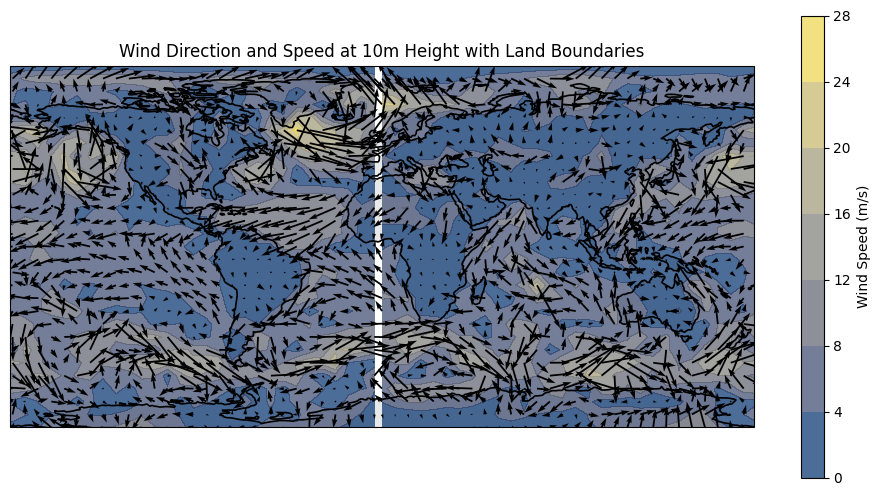

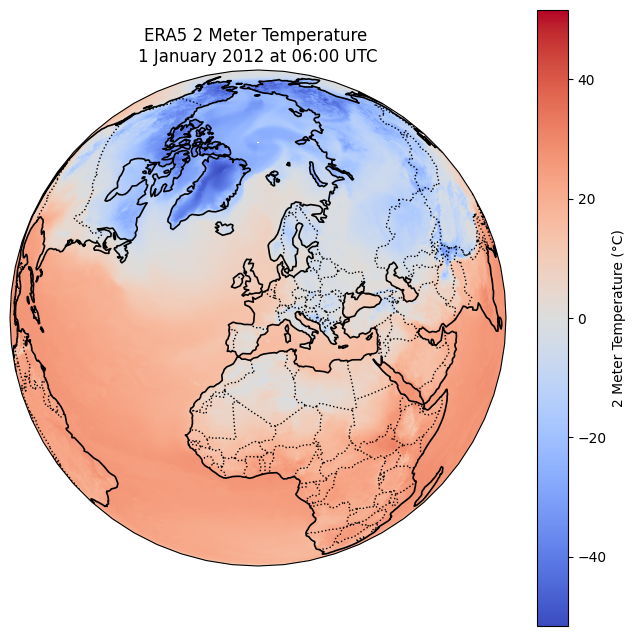

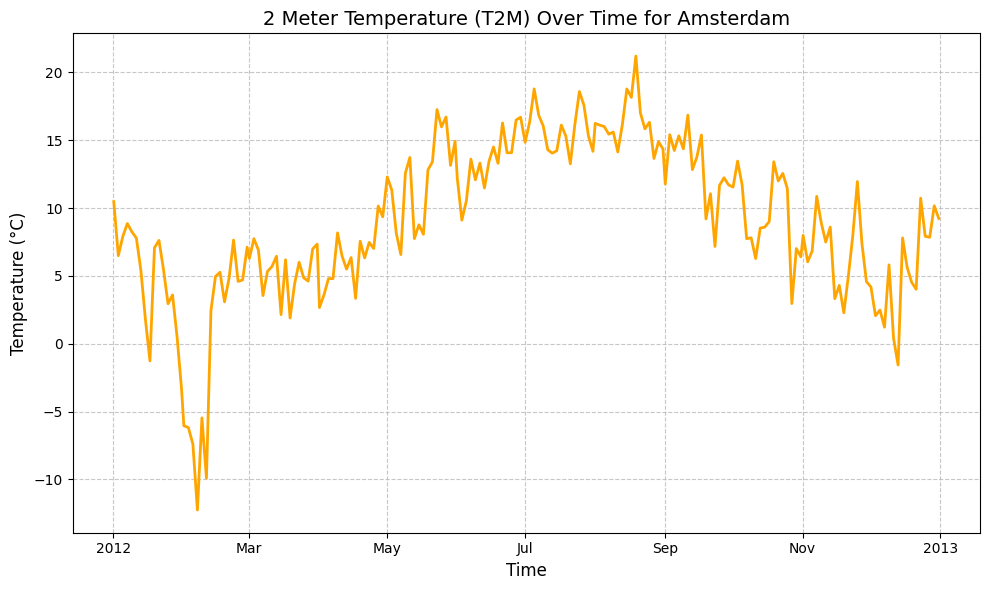

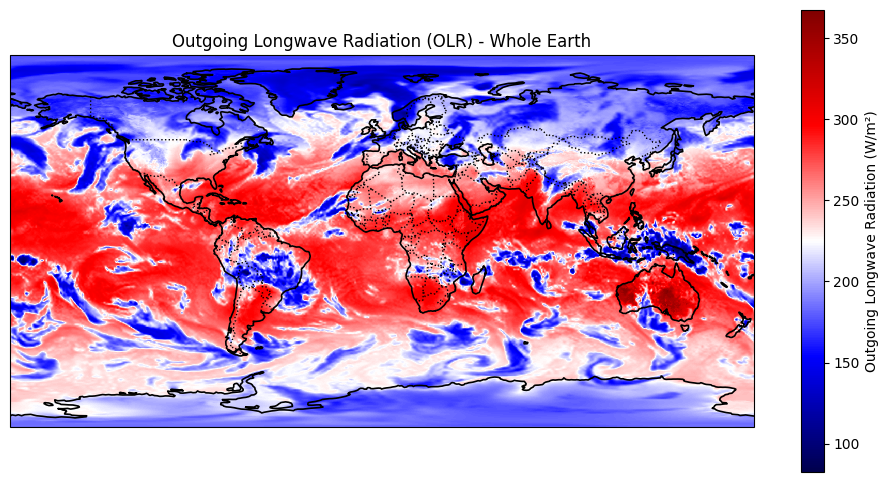

In [ ]:
# Define the latitude and longitude bounds to include the whole of Europe, including Iceland and England
europe_lat_bounds = (75, 30)  # From Iceland in the north to southern Europe
europe_lon_bounds = (-90, 50)  # From Iceland and Portugal in the west to eastern Europe

# Select the 't2m' variable and filter for Europe
t2m_europe = ds['t2m'].sel(
    latitude=slice(europe_lat_bounds[1], europe_lat_bounds[0]),
    longitude=slice(europe_lon_bounds[0], europe_lon_bounds[1])
).isel(valid_time=0)  # Select the first time step for simplicity

# Convert temperature from Kelvin to Celsius
t2m_europe_celsius = t2m_europe - 273.15

# Define skip value for wind vectors
skip = 5
# Select wind data without filtering for Europe
lon = ds['longitude'][::skip]
lat = ds['latitude'][::skip]
u10 = ds['u10'].isel(valid_time=0)[::skip, ::skip]
v10 = ds['v10'].isel(valid_time=0)[::skip, ::skip]

# Apply skipping after selecting the matching latitude and longitude
u10 = u10[::skip, ::skip]
v10 = v10[::skip, ::skip]

# Calculate wind speed
wind_speed = np.sqrt(u10**2 + v10**2)

# Create a plot with Cartopy
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Reduce longitude and latitude to match wind_speed dimensions
reduced_lon = lon[::skip]
reduced_lat = lat[::skip]

# Background color with wind speed
cf = ax.contourf(
    reduced_lon,
    reduced_lat,
    wind_speed,
    cmap='cividis',
    alpha=0.7,
    transform=ccrs.PlateCarree()
)

# Wind vectors (arrows)
ax.quiver(reduced_lon, reduced_lat, u10, v10, scale=300, color='black', transform=ccrs.PlateCarree())

# Add coastlines and land features
ax.add_feature(cfeature.COASTLINE, linewidth=1.2)
ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.5)

# Labels and title
plt.colorbar(cf, label="Wind Speed (m/s)")
ax.set_title("Wind Direction and Speed at 10m Height with Land Boundaries")

plt.show()

# Select the 't2m' variable for a specific date in 2012
t2m = ds['t2m'].sel(valid_time='2012-01-01T06:00:00')

# Convert temperature from Kelvin to Celsius
t2m_celsius = t2m - 273.15

# Create a figure with an Orthographic projection
fig, ax = plt.subplots(
    figsize=(8, 8),
    subplot_kw={'projection': ccrs.Orthographic(central_longitude=0, central_latitude=45)}
)

# Plot the 2-meter temperature
t2m_celsius.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',
    cbar_kwargs={'label': '2 Meter Temperature (°C)'}
)

# Adding coastlines and other features
ax.add_feature(cfeature.COASTLINE, linewidth=1.2)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.5)

# Set the title
ax.set_title('ERA5 2 Meter Temperature \n1 January 2012 at 06:00 UTC')

# Show the plot
plt.show()


# Extract temperature at Amsterdam for all valid times and convert from Kelvin to Celsius
amsterdam_t2m_time = ds['t2m'].sel(latitude=52.25, longitude=4.75, method='nearest') - 273.15

# Plot the 2-meter temperature over time for Amsterdam
plot = amsterdam_t2m_time.plot(figsize=(10, 6), color='orange', linewidth=2)
plt.title("2 Meter Temperature (T2M) Over Time for Amsterdam", fontsize=14)
plt.xlabel("Time", fontsize=12)
plt.ylabel("Temperature (°C)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Plot the Outgoing long range variable for the whole Earth
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

#Converting the 'ttr' variable to 'olr'
accumulation_period_seconds = 3600
ttr_flux = ds['ttr'] / accumulation_period_seconds
olr = -ttr_flux 

# Plot the 'olr' variable for the whole Earth
olr.isel(valid_time=0).plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='seismic',
    cbar_kwargs={'label': 'Outgoing Longwave Radiation (W/m²)'}
)

# Add coastlines and other features
ax.add_feature(cfeature.COASTLINE, linewidth=1.2)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.5)

# Set the title
ax.set_title('Outgoing Longwave Radiation (OLR) - Whole Earth')

# Show the plot
plt.show()



# Adjusting and converting the dataset

As can be seen in the examples above some of the variables are converted. To make the variables more readable and better to interpret we convert and adjust some of the variables.


In [25]:
# Loop through all data variables and apply conversions in place
for var_name in list(ds.data_vars):  # Use list() to avoid runtime modification issues
    if var_name == 't2m':
        # Convert t2m from Kelvin to °C
        ds[var_name] = ds[var_name] - 273.15
        ds[var_name].attrs['units'] = '°C'
        ds[var_name].attrs['long_name'] = '2m Temperature'
    elif var_name == 'd2m':
        # Convert d2m from Kelvin to °C
        ds[var_name] = ds[var_name] - 273.15
        ds[var_name].attrs['units'] = '°C'
        ds[var_name].attrs['long_name'] = '2m Dewpoint Temperature'
    elif var_name == 'sst':
        # Convert sst from Kelvin to °C
        ds[var_name] = ds[var_name] - 273.15
        ds[var_name].attrs['units'] = '°C'
        ds[var_name].attrs['long_name'] = 'Sea Surface Temperature'
    elif var_name == 'z':
        # Convert z from geopotential (m²/s²) to geopotential height (m)
        g = 9.81  # Acceleration due to gravity (m/s²)
        ds[var_name] = ds[var_name] / g
        ds[var_name].attrs['units'] = 'm'
        ds[var_name].attrs['long_name'] = 'Geopotential Height'
    elif var_name == 'msl':
        # Convert msl from Pa to hPa
        ds[var_name] = ds[var_name] / 100
        ds[var_name].attrs['units'] = 'hPa'
        ds[var_name].attrs['long_name'] = 'Mean Sea Level Pressure'
    elif var_name == 'ttr':
        # Convert ttr from J/m² to W/m² and then to OLR (olr = -ttr), rename to olr
        ttr_flux = ds[var_name] / accumulation_period_seconds  # Convert to W/m²
        ds['olr'] = -ttr_flux
        ds['olr'].attrs['units'] = 'W/m²'
        ds['olr'].attrs['long_name'] = 'Outgoing Longwave Radiation'
        ds = ds.drop_vars(var_name)  # Remove the original ttr variable
    else:
        # Ensure units and long_name are set for other variables
        if 'units' not in ds[var_name].attrs:
            ds[var_name].attrs['units'] = 'unknown'
        if 'long_name' not in ds[var_name].attrs:
            ds[var_name].attrs['long_name'] = var_name

# Verify the updated dataset
print("Variables in the dataset:", list(ds.data_vars))
print(ds)

Variables in the dataset: ['tp', 'str', 'u10', 'v10', 'd2m', 't2m', 'msl', 'sst', 'z', 'tcwv', 'v100', 'u100', 'olr']
<xarray.Dataset> Size: 10GB
Dimensions:     (valid_time: 187, latitude: 721, longitude: 1440)
Coordinates:
    number      int64 8B 0
  * valid_time  (valid_time) datetime64[ns] 1kB 2012-01-01T06:00:00 ... 2012-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 3kB '0001' '0001' '0001' ... '0001' '0001'
Data variables: (12/13)
    tp          (valid_time, latitude, longitude) float32 777MB 8.583e-06 ......
    str         (valid_time, latitude, longitude) float32 777MB -2.099e+05 .....
    u10         (valid_time, latitude, longitude) float32 777MB 0.4796 ... 0....
    v10         (valid_time, latitude, longitude) float32 777MB 0.2169 ... -0...
    d2m         (valid_time, latitude, longitude) float32 777MB -30.24 ... -3...
   

To check on Anomalies and check the variables on correlation we take a sample of the data.
For the sample we are taking the coordinates of Amsterdam.

In [27]:

amsterdam_data = ds.sel(latitude=52.25, longitude=4.75, method='nearest')

# Extract time
time_values = amsterdam_data['valid_time'].values

# Create a dictionary to store the data
data_dict = {'time': time_values}

# Loop through all data variables and add them to the dictionary
for var_name in ds.data_vars:
    var_values = amsterdam_data[var_name].values
    data_dict[var_name] = var_values

# Create the DataFrame
df_amsterdam = pd.DataFrame(data_dict)

# Add wind speed variables
df_amsterdam['Wind_Speed_10m'] = np.sqrt(df_amsterdam['u10']**2 + df_amsterdam['v10']**2)
df_amsterdam['Wind_Speed_100m'] = np.sqrt(df_amsterdam['u100']**2 + df_amsterdam['v100']**2)

# Save the updated DataFrame
df_amsterdam.to_csv("amsterdam_all_variables_2012.csv", index=False)
print("Updated DataFrame saved to amsterdam_all_variables_2012.csv")
print("Summary statistics:\n", df_amsterdam.describe())

Updated DataFrame saved to amsterdam_all_variables_2012.csv
Summary statistics:
                                 time          tp           str         u10  \
count                            187  187.000000     187.00000  187.000000   
mean   2012-07-01 06:07:42.032085504    0.000131 -163763.65625    1.094209   
min              2012-01-01 06:00:00    0.000000 -379389.00000   -7.817413   
25%              2012-03-31 18:00:00    0.000000 -237522.03125   -1.516907   
50%              2012-07-01 06:00:00    0.000007 -173261.00000    1.198151   
75%              2012-09-30 06:00:00    0.000082  -79747.68750    3.365479   
max              2012-12-31 06:00:00    0.002053   23556.43750   12.918930   
std                              NaN    0.000316   93234.28125    3.492122   

              v10         d2m         t2m          msl  sst           z  \
count  187.000000  187.000000  187.000000   187.000000  0.0  187.000000   
mean     1.373182    7.171566    9.055519  1014.479614  NaN   -1.4

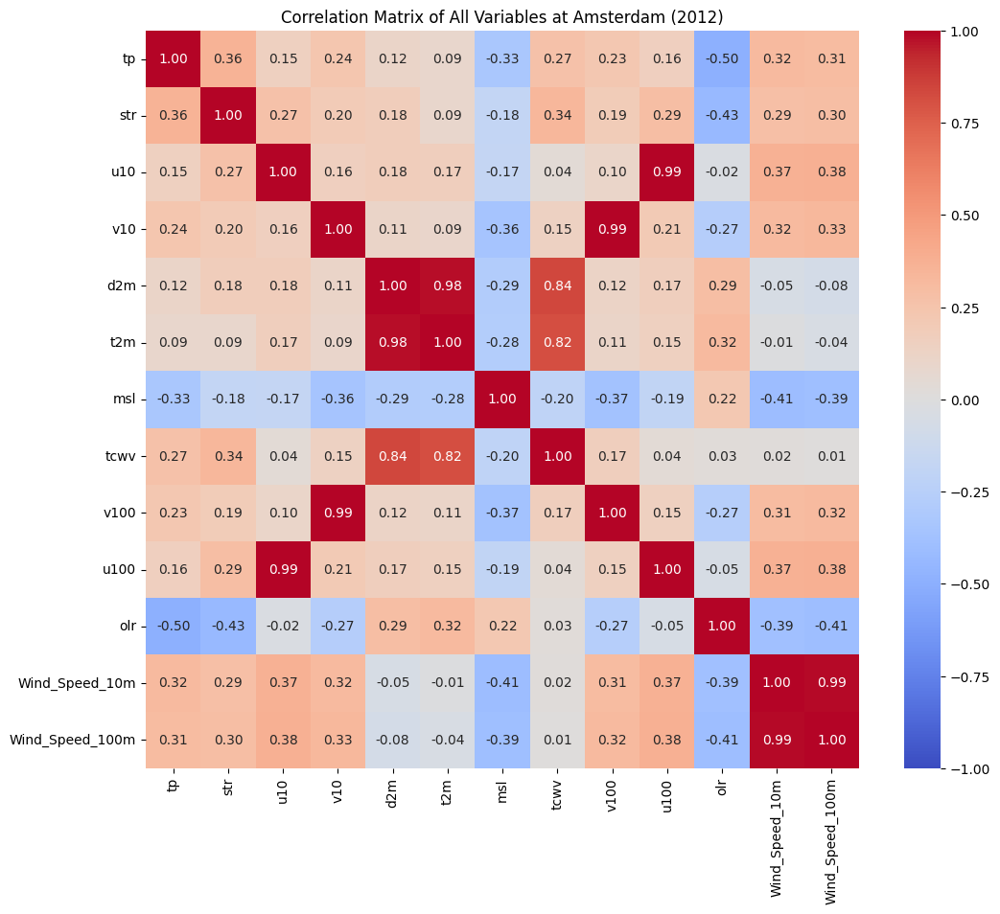

In [ ]:
# Identify numerical columns (excluding time, sst, and z. As these variables are non numerical or not relevant)
numerical_cols = [col for col in df_amsterdam.columns if col not in ['time', 'sst', 'z']]

# Compute the correlation matrix
correlation_matrix = df_amsterdam[numerical_cols].corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0, fmt='.2f')
plt.title('Correlation Matrix of All Variables at Amsterdam (2012)')
plt.show()


Strong positive correlations are observed between related variables, such as u10 and u100 (0.99) and v10 and v100 (0.99), indicating that wind components at 10m and 100m are highly consistent, as expected. olr (Outgoing Longwave Radiation) shows moderate negative correlations with variables like tp (total precipitation, -0.50), str (surface net thermal radiation, -0.43), and wind speeds (-0.39 to -0.41), indicating that higher OLR (associated with clearer skies) tends to occur with lower precipitation and weaker winds.

# Checking for Anomalies

In [ ]:
# Identify numerical columns (exclude 'time' and any anomaly/outlier columns)
numerical_cols = [col for col in df_amsterdam.columns if col != 'time' and col != 'z' and not col.endswith('_Anomaly') and not col.endswith('_Outlier')]

# Compute anomalies and standard deviations
anomaly_dict = {}
std_dict = {}
for col in numerical_cols:
    # Compute anomaly (value - mean)
    anomaly_col = f"{col}_Anomaly"
    df_amsterdam[anomaly_col] = df_amsterdam[col] - df_amsterdam[col].mean()
    anomaly_dict[col] = anomaly_col
    
    # Compute standard deviation of the variable
    std_dict[col] = df_amsterdam[col].std()

# Define a threshold for outliers (e.g., 2 standard deviations)
threshold = 2  # You can change this to 3 for a stricter threshold (99.7% confidence)

# Identify outliers for each variable
outliers_dict = {}
for col in numerical_cols:
    anomaly_col = anomaly_dict[col]
    std = std_dict[col]
    
    # Flag outliers where |anomaly| > threshold * std
    outlier_col = f"{col}_Outlier"
    df_amsterdam[outlier_col] = np.abs(df_amsterdam[anomaly_col]) > (threshold * std)
    # Store outliers with relevant columns (time, value, anomaly)
    outliers_dict[col] = df_amsterdam[df_amsterdam[outlier_col]][['time', col, anomaly_col]]

# Step 1: Summarize the number of outliers for each variable in a table
print("Summary of Outliers (Threshold = {} Standard Deviations):".format(threshold))
outlier_summary = pd.DataFrame({
    'Variable': numerical_cols,
    'Number of Outliers': [df_amsterdam[f"{col}_Outlier"].sum() for col in numerical_cols],
    'Total Observations': [len(df_amsterdam)] * len(numerical_cols),
    'Percentage of Outliers': [df_amsterdam[f"{col}_Outlier"].mean() * 100 for col in numerical_cols]
})
outlier_summary = outlier_summary.sort_values(by='Number of Outliers', ascending=False)
print(outlier_summary.to_string(index=False))

# Step 2: Brief summary of findings
print("\nSummary of Outlier Analysis:")
total_outliers = outlier_summary['Number of Outliers'].sum()
total_vars_with_outliers = (outlier_summary['Number of Outliers'] > 0).sum()
print(f"Across {len(numerical_cols)} variables, a total of {total_outliers} outliers were detected.")


Summary of Outliers (Threshold = 2 Standard Deviations):
       Variable  Number of Outliers  Total Observations  Percentage of Outliers
Wind_Speed_100m                  10                 187                5.347594
            msl                  10                 187                5.347594
            olr                  10                 187                5.347594
 Wind_Speed_10m                  10                 187                5.347594
             tp                   8                 187                4.278075
            t2m                   8                 187                4.278075
           u100                   8                 187                4.278075
            d2m                   8                 187                4.278075
            v10                   6                 187                3.208556
            u10                   6                 187                3.208556
           v100                   6                 187        

Variables such as Wind_Speed_100m, msl, and olr each exhibit the highest number of outliers (10 outliers, 5.35% of observations), indicating frequent extreme events in wind speed, mean sea level pressure, and outgoing longwave radiation, likely reflecting stormy periods with low pressure and high cloud cover. This may be linked to North Atlantic Oscillation (NAO) influences.

# Analysis on large-scale weather oscillation
To address my research question, it is valuable to examine large-scale weather oscillations in detail. In this exploratory data analysis (EDA), we focus on the North Atlantic Oscillation (NAO), a prominent atmospheric pressure pattern that significantly influences Europe’s subseasonal weather variability. The NAO, characterized by fluctuations in the pressure difference between the Azores High and the Icelandic Low, plays a critical role in shaping weather conditions across the continent, affecting temperature, precipitation, and storm tracks.

In [ ]:
# Define the NAO region in the 0° to 360° range
lat_min, lat_max = 20, 80  # 20°N to 80°N
lon_min_360, lon_max_360 = 270, 40  # 90°W (270°E) to 40°E

# Select the two parts of the longitude range
olr_part1 = ds['olr'].sel(
    latitude=slice(lat_max, lat_min),  # 80°N to 20°N
    longitude=slice(lon_min_360, 360)  # 270°E to 360°
)

olr_part2 = ds['olr'].sel(
    latitude=slice(lat_max, lat_min),  # 80°N to 20°N
    longitude=slice(0, lon_max_360)  # 0° to 40°E
)

# Concatenate the two parts along the longitude dimension
olr_nao = xr.concat([olr_part1, olr_part2], dim='longitude')
olr_nao = olr_nao.sortby('longitude')


# Verify the data
print("OLR data shape:", olr_nao.shape)
print("Time steps:", olr_nao.valid_time.values[:5])  
print("OLR range (W/m²):", olr_nao.min().values, "to", olr_nao.max().values)

# Create a directory to store the frames
output_dir = "olr_frames"
os.makedirs(output_dir, exist_ok=True)

# Define the projection for the map
projection = ccrs.PlateCarree()

# Loop through each time step and create a frame
frames = []
for i, time in enumerate(olr_nao.valid_time):
    # Extract OLR for this time step
    olr_t = olr_nao.isel(valid_time=i)
    
    # Create a new figure
    plt.figure(figsize=(10, 6))
    ax = plt.axes(projection=projection)
    
    # Set the extent of the map to focus on the NAO region
    ax.set_extent([-90, 40, 20, 80], crs=ccrs.PlateCarree())

    # Plot OLR
    im = olr_t.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap='viridis',  # Color map for OLR
        vmin=100, vmax=300,  # Typical OLR range in W/m²
        add_colorbar=True,
        cbar_kwargs={'label': 'OLR (W/m²)'}
    )
    
    # Add geographical features
    ax.coastlines()
    ax.gridlines(draw_labels=True)
    
    # Add title with the date
    date_str = str(time.values)[:10]  # Extract YYYY-MM-DD
    ax.set_title(f"Outgoing Longwave Radiation (OLR) - {date_str}")
    
    # Save the frame
    frame_path = os.path.join(output_dir, f"frame_{i:03d}.png")
    plt.savefig(frame_path, bbox_inches='tight', dpi=100)
    plt.close()
    
    frames.append(frame_path)

    

OLR data shape: (187, 241, 521)
Time steps: ['2012-01-01T06:00:00.000000000' '2012-01-03T06:00:00.000000000'
 '2012-01-05T06:00:00.000000000' '2012-01-07T06:00:00.000000000'
 '2012-01-09T06:00:00.000000000']
Any NaN values in OLR? False
OLR range (W/m²): 80.51583 to 349.80972


In the code above I am analyzing the North Atlantic Oscillation (NAO) by examining Outgoing Longwave Radiation (OLR) data in the NAO region. 
This involves:
 - selecting OLR data
 - creating maps for each time step
 - saving them as frames for an CNN model.

In [ ]:
# Create the GIF
gif_path = "olr_nao_2012.gif"
with imageio.get_writer(gif_path, mode='I', duration=1.0) as writer:
    for frame in frames:
        image = imageio.imread(frame)
        writer.append_data(image)

print(f"GIF saved to {gif_path}")

# Clean up the frame files
shutil.rmtree(output_dir)

C:\Users\31610\AppData\Local\Temp\ipykernel_28028\4272892680.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)


GIF saved to olr_nao_2012.gif


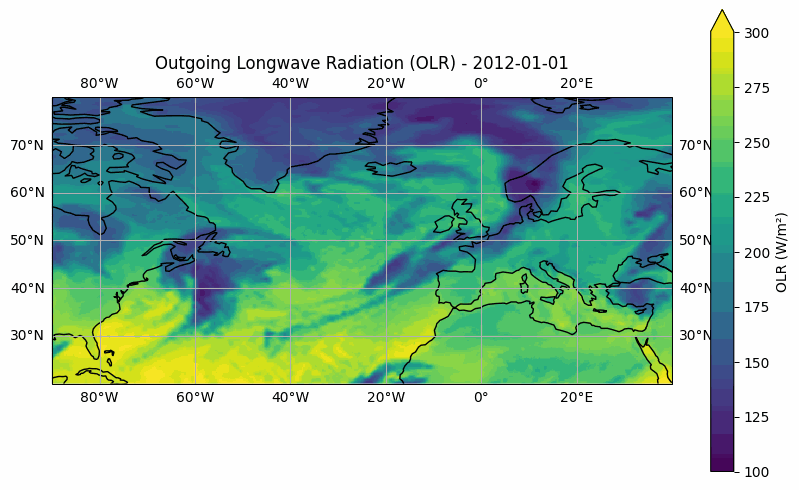

In [ ]:
# Display the GIF
gif_path = "olr_nao_2012.gif"
Image(filename=gif_path)

The GIF above shows the Outgoing Longwave Radiation (OLR) over the North Atlantic Oscillation (NAO) region for the year 2012.
The GIF provides a visual representation of how OLR changes over time in this region.

# Conclusion

 The EDA confirms that the ECMWF ERA5 reanalysis dataset is of high quality, with no major flaws detected. This was as expected from a reanalyzed product. Some small conversions were necessary to enhance usability.  The data, stored in NetCDF format, presents some challenges for processing but offers extensive visualization possibilities, as demonstrated by the examples. Given the dataset’s 3-dimensional nature, selection of coordinates is essential to optimize computational efficiency. Furthermore, the NAO example illustrates the potential to study large-scale weather oscillations, revealing patterns in OLR that can provide insights into subseasonal weather variability over Europe.